# Chapter 15: Processing Sequences Using RNNs and CNNs

### Ensure GPU Env is working correctly

In [1]:
import tensorflow as tf
import os
from tensorflow import keras

In [2]:
tf.__version__

'2.6.0'

In [3]:
keras.__version__

'2.6.0'

In [4]:
print("Num of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num of GPUs Available:  1


## Additional Libraries 

In [2]:
import numpy as np
import pandas as pd
import os
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from pathlib import Path

## Basic RNNs

### Generating the dataset

In [6]:
def generate_dataset(batch_size, n_steps):
    freq1, freq2, offset1, offset2 = np.random.rand(4, batch_size, 1)
    time = np.linspace(0, 1, n_steps)
    series = 0.5 * np.sin((time - offset1) * (freq1 * 10 + 10)) # first sin wave
    series += 0.2 * np.sin((time - offset2) * (freq2 * 20 + 10)) # second sin wave
    series += 0.1 * (np.random.rand(batch_size, n_steps) - 0.5) #noise
    return series[..., np.newaxis].astype(np.float32)

In [7]:
n_steps = 50
series = generate_dataset(10000, n_steps + 1)
X_train, y_train = series[:7000, :n_steps], series[:7000, -1]
X_valid, y_valid = series[7000:9000, :n_steps], series[7000:9000, -1]
X_test, y_test = series[9000:, :n_steps], series[9000:, -1]

In [8]:
X_train.shape, y_train.shape

((7000, 50, 1), (7000, 1))

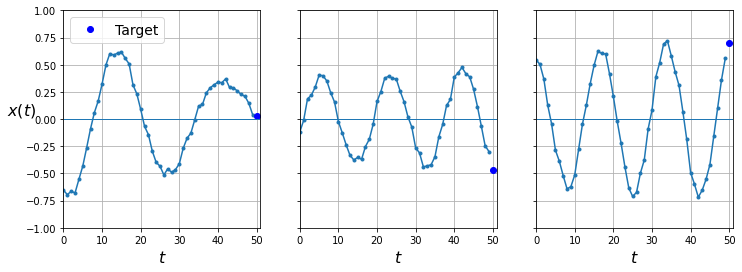

In [9]:
def plot_series(series, y=None, y_pred=None, x_label="$t$", y_label="$x(t)", legend=True):
    plt.plot(series, ".-")
    if y is not None:
        plt.plot(n_steps, y, "bo", label="Target")
    if y_pred is not None:
        plt.plot(n_steps, y_pred, "rx", markersize=10, label="Prediction")
    plt.grid(True)
    if x_label:
        plt.xlabel(x_label, fontsize=16)
    if y_label:
        plt.ylabel(y_label, fontsize=16, rotation=0)
    plt.hlines(0, 0, 100, linewidth=1)
    plt.axis([0, n_steps + 1, -1, 1])
    if legend and (y or y_pred):
        plt.legend(fontsize=14, loc="upper left")
    
fig, axes = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(12, 4))
for col in range(3):
    plt.sca(axes[col])
    plot_series(X_valid[col, :, 0], y_valid[col, 0],
               y_label=("$x(t)$" if col==0 else None),
               legend=(col == 0))
plt.show()
  

### Computing Baselines

In [10]:
y_pred = X_valid[:, -1]
np.mean(keras.losses.mean_squared_error(y_valid, y_pred))

0.0175938

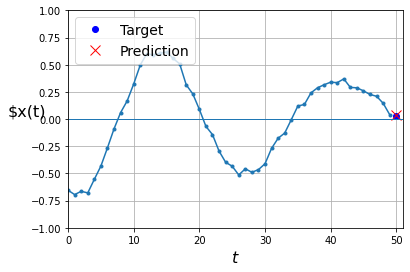

In [11]:
plot_series(X_valid[0, :, 0], y_valid[0, 0], y_pred[0, 0])
plt.show()

In [12]:
# now to train a model and check our loss on the test set
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[50, 1]),
    keras.layers.Dense(1)
])

model.compile(loss="mse", optimizer="adam")
history = model.fit(X_train, y_train, epochs=20,
                   validation_data=(X_valid, y_valid))

Epoch 1/20
219/219 [==============================] - 5s 3ms/step - loss: 0.1272 - val_loss: 0.0369
Epoch 2/20
219/219 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.0214
Epoch 3/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0175 - val_loss: 0.0145
Epoch 4/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0121 - val_loss: 0.0106
Epoch 5/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0089 - val_loss: 0.0079
Epoch 6/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0069 - val_loss: 0.0063
Epoch 7/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0057 - val_loss: 0.0053
Epoch 8/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0050 - val_loss: 0.0048
Epoch 9/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0046 - val_loss: 0.0045
Epoch 10/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0043 - val_loss: 0.0042

In [13]:
model.evaluate(X_test, y_test)

32/32 [==============================] - 0s 1ms/step - loss: 0.0028


0.0027570296078920364

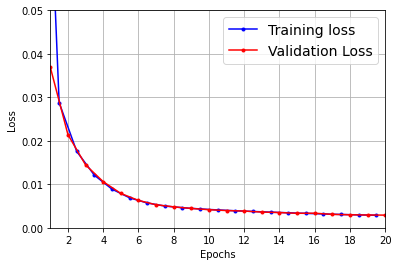

In [14]:
def plot_learning_curves(loss, val_loss):
    plt.plot(np.arange(len(loss)) + 0.5, loss, "b.-", label="Training loss")
    plt.plot(np.arange(len(val_loss)) + 1, val_loss, "r.-", label="Validation Loss")
    plt.gca().xaxis.set_major_locator(mpl.ticker.MaxNLocator(integer=True))
    plt.axis([1, 20, 0, 0.05])
    plt.legend(fontsize=14)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid(True)
    
plot_learning_curves(history.history["loss"], history.history["val_loss"])
plt.show()

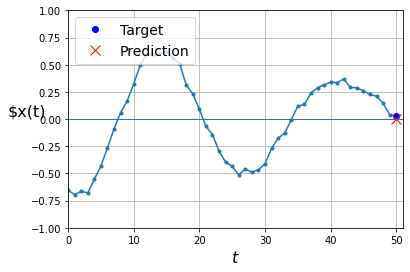

In [15]:
y_pred = model.predict(X_valid)
plot_series(X_valid[0, :, 0], y_valid[0, 0], y_pred[0, 0])
plt.show()

## Now to try and achieve the same using a simple RNN 

In [16]:
model = keras.models.Sequential([
    keras.layers.SimpleRNN(1, input_shape=[None, 1])
])

optimizer = keras.optimizers.Adam(learning_rate=0.005)
model.compile(loss="mse", optimizer=optimizer)
history = model.fit(X_train, y_train, epochs=20,
                   validation_data=(X_valid, y_valid))

Epoch 1/20
219/219 [==============================] - 15s 66ms/step - loss: 0.6394 - val_loss: 0.4714
Epoch 2/20
219/219 [==============================] - 14s 66ms/step - loss: 0.3090 - val_loss: 0.1821
Epoch 3/20
219/219 [==============================] - 14s 66ms/step - loss: 0.1513 - val_loss: 0.1484
Epoch 4/20
219/219 [==============================] - 14s 65ms/step - loss: 0.1439 - val_loss: 0.1433
Epoch 5/20
219/219 [==============================] - 14s 66ms/step - loss: 0.1442 - val_loss: 0.1501
Epoch 6/20
219/219 [==============================] - 14s 63ms/step - loss: 0.1455 - val_loss: 0.1506
Epoch 7/20
219/219 [==============================] - 14s 64ms/step - loss: 0.1468 - val_loss: 0.1484
Epoch 8/20
219/219 [==============================] - 15s 67ms/step - loss: 0.1433 - val_loss: 0.1405
Epoch 9/20
219/219 [==============================] - 15s 67ms/step - loss: 0.1457 - val_loss: 0.1526
Epoch 10/20
219/219 [==============================] - 15s 70ms/step - loss: 0.130

In [17]:
model.evaluate(X_valid, y_valid)

63/63 [==============================] - 1s 15ms/step - loss: 0.0123


0.012297743931412697

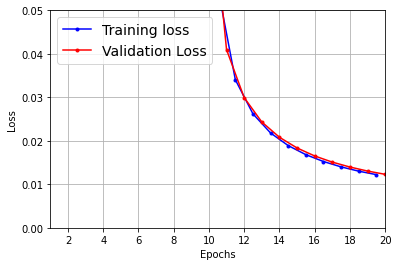

In [18]:
plot_learning_curves(history.history["loss"], history.history["val_loss"])
plt.show()

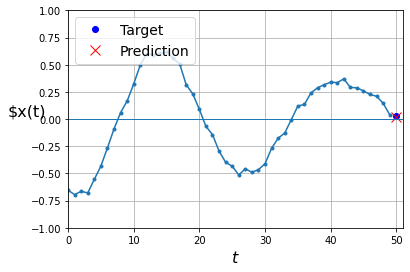

In [19]:
y_pred = model.predict(X_valid)
plot_series(X_valid[0, :, 0], y_valid[0, 0], y_pred[0, 0])
plt.show()

## Deep RNNs

In [20]:
model = keras.models.Sequential([
    keras.layers.SimpleRNN(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.SimpleRNN(20, return_sequences=True),
    keras.layers.SimpleRNN(1)
])

model.compile(loss="mse", optimizer="adam")
history = model.fit(X_train, y_train, epochs=20,
                    validation_data=(X_valid, y_valid))

Epoch 1/20
219/219 [==============================] - 62s 279ms/step - loss: 0.0231 - val_loss: 0.0050
Epoch 2/20
219/219 [==============================] - 59s 269ms/step - loss: 0.0043 - val_loss: 0.0039
Epoch 3/20
219/219 [==============================] - 59s 268ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 4/20
219/219 [==============================] - 60s 274ms/step - loss: 0.0032 - val_loss: 0.0031
Epoch 5/20
219/219 [==============================] - 58s 263ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 6/20
219/219 [==============================] - 57s 261ms/step - loss: 0.0029 - val_loss: 0.0029
Epoch 7/20
219/219 [==============================] - 58s 263ms/step - loss: 0.0028 - val_loss: 0.0029
Epoch 8/20
219/219 [==============================] - 54s 246ms/step - loss: 0.0028 - val_loss: 0.0026
Epoch 9/20
219/219 [==============================] - 53s 242ms/step - loss: 0.0027 - val_loss: 0.0027
Epoch 10/20
219/219 [==============================] - 55s 250ms/step - l

In [21]:
model.evaluate(X_valid, y_valid)

63/63 [==============================] - 3s 50ms/step - loss: 0.0027


0.002729611238464713

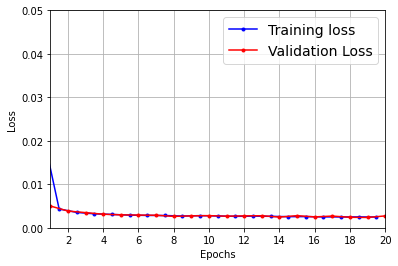

In [22]:
plot_learning_curves(history.history["loss"], history.history["val_loss"])
plt.show()

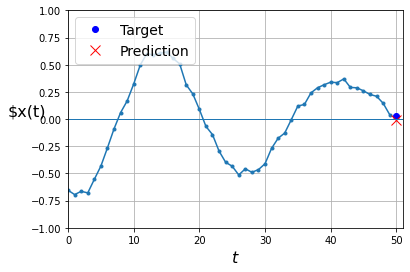

In [23]:
y_pred = model.predict(X_valid)
plot_series(X_valid[0, :, 0], y_valid[0, 0], y_pred[0, 0])
plt.show()

In [27]:
# Now for a model where only the first layer returns the sequences onto the second layer

model = keras.models.Sequential([
    keras.layers.SimpleRNN(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.SimpleRNN(20),
    keras.layers.Dense(1)
])

model.compile(loss="mse", optimizer="adam")
history = model.fit(X_train, y_train, epochs=20,
                   validation_data=(X_valid, y_valid))

Epoch 1/20
219/219 [==============================] - 38s 170ms/step - loss: 0.0128 - val_loss: 0.0034
Epoch 2/20
219/219 [==============================] - 35s 159ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 3/20
219/219 [==============================] - 34s 156ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 4/20
219/219 [==============================] - 36s 164ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 5/20
219/219 [==============================] - 35s 158ms/step - loss: 0.0023 - val_loss: 0.0023
Epoch 6/20
219/219 [==============================] - 35s 160ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 7/20
219/219 [==============================] - 35s 162ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 8/20
219/219 [==============================] - 35s 159ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 9/20
219/219 [==============================] - 35s 158ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 10/20
219/219 [==============================] - 34s 157ms/step - l

In [28]:
model.evaluate(X_valid, y_valid)

63/63 [==============================] - 2s 32ms/step - loss: 0.0022


0.002172330394387245

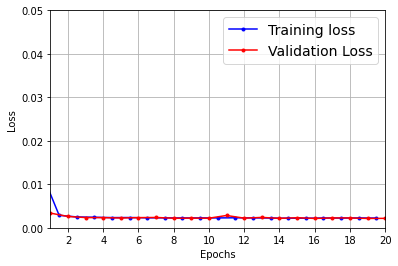

In [29]:
plot_learning_curves(history.history["loss"], history.history["val_loss"])
plt.show()

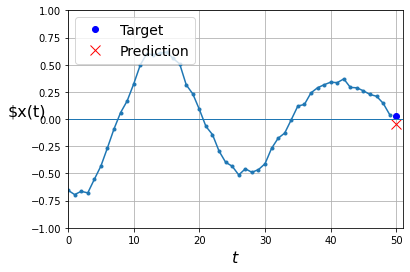

In [30]:
y_pred = model.predict(X_valid)
plot_series(X_valid[0, :, 0], y_valid[0, 0], y_pred[0, 0])
plt.show()

## Forecasting Ahead

In [62]:
new_time_series = generate_dataset(1, n_steps + 10)
X_new, Y_new = new_time_series[:, :n_steps], new_time_series[:, n_steps:]
X = X_new
for step_forward in range(10):
    y_pred_one = model.predict(X[:, step_forward:])[:, np.newaxis, :]
    X = np.concatenate([X, y_pred_one], axis=1)

Y_pred = X[:, n_steps:]

In [63]:
Y_pred.shape

(1, 10, 1)

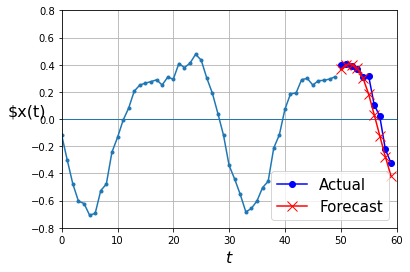

In [64]:
def plot_multiple_forecasts(X, Y, Y_pred):
    n_steps = X.shape[1]
    preds = Y.shape[1]
    plot_series(X[0, :, 0])
    plt.plot(np.arange(n_steps, n_steps + preds), Y[0, :, 0], "bo-", label="Actual")
    plt.plot(np.arange(n_steps, n_steps + preds), Y_pred[0, :, 0], "rx-", label="Forecast", markersize=10)
    plt.axis([0, n_steps + preds, -0.8, 0.8])
    plt.legend(fontsize=15)
    
plot_multiple_forecasts(X_new, Y_new, Y_pred)
plt.show()

In [66]:
# Now for a model prediction setup for our own sequential model
# Start by splitting data

n_steps = 50
series = generate_dataset(10000, n_steps + 10)
X_train, Y_train = series[:7000, :n_steps], series[:7000, -10:, 0]
X_valid, Y_valid = series[7000:9000, :n_steps], series[7000:9000, -10:, 0]
X_test, Y_test = series[9000:, :n_steps], series[9000:, -10:, 0]

In [67]:
X = X_valid
for step_ahead in range(10):
    y_pred_one = model.predict(X)[:, np.newaxis, :]
    X = np.concatenate([X, y_pred_one], axis=1)
    
Y_pred = X[:, n_steps:, 0]

In [69]:
Y_pred.shape

(2000, 10)

In [70]:
#baseline
np.mean(keras.metrics.mean_squared_error(Y_valid, Y_pred))

0.020899406

Now for a comparison with a simple linear model from the baseline:

In [73]:
Y_base_model = np.tile(X_valid[:, -1], 10)
np.mean(keras.metrics.mean_squared_error(Y_valid, Y_base_model))

0.25379598

In [77]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[50, 1]),
    keras.layers.Dense(10)
])

model.compile(loss="mse", optimizer="adam")
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 1s 3ms/step - loss: 0.1050 - val_loss: 0.0475
Epoch 2/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0349 - val_loss: 0.0272
Epoch 3/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0230 - val_loss: 0.0202
Epoch 4/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0186 - val_loss: 0.0174
Epoch 5/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0165 - val_loss: 0.0157
Epoch 6/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0152 - val_loss: 0.0147
Epoch 7/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0141 - val_loss: 0.0137
Epoch 8/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0132 - val_loss: 0.0129
Epoch 9/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0125 - val_loss: 0.0123
Epoch 10/20
219/219 [==============================] - 1s 3ms/step - loss: 0.0118 - val_loss: 0.0117

In [78]:
model = keras.models.Sequential([
    keras.layers.SimpleRNN(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.SimpleRNN(20),
    keras.layers.Dense(10)
])

model.compile(loss="mse", optimizer="adam")
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 36s 162ms/step - loss: 0.0447 - val_loss: 0.0220
Epoch 2/20
219/219 [==============================] - 36s 164ms/step - loss: 0.0168 - val_loss: 0.0151
Epoch 3/20
219/219 [==============================] - 36s 163ms/step - loss: 0.0127 - val_loss: 0.0105
Epoch 4/20
219/219 [==============================] - 33s 150ms/step - loss: 0.0102 - val_loss: 0.0092
Epoch 5/20
219/219 [==============================] - 35s 158ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 6/20
219/219 [==============================] - 34s 157ms/step - loss: 0.0088 - val_loss: 0.0088
Epoch 7/20
219/219 [==============================] - 33s 150ms/step - loss: 0.0085 - val_loss: 0.0077
Epoch 8/20
219/219 [==============================] - 36s 164ms/step - loss: 0.0084 - val_loss: 0.0087
Epoch 9/20
219/219 [==============================] - 36s 164ms/step - loss: 0.0081 - val_loss: 0.0089
Epoch 10/20
219/219 [==============================] - 35s 160ms/step - l

In [80]:
series = generate_dataset(1, 50 + 10)
X_new, Y_new = series[:, :50, :], series[:, -10:, :]
Y_pred = model.predict(X_new)[..., np.newaxis]

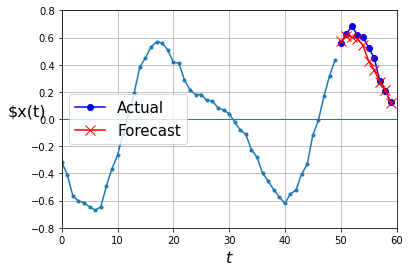

In [81]:
plot_multiple_forecasts(X_new, Y_new, Y_pred)

Now for a RNN forecast model that predicts the next 10 steps at each foreward step. So at step 0, it predicts 1-10, at 1 it predicts 2-11 and so on. 

In [83]:
n_steps = 50
series = generate_dataset(10000, n_steps + 10)
X_train = series[:7000, :n_steps]
X_valid = series[7000:9000, :n_steps]
X_test = series[9000:, :n_steps]
Y = np.empty((10000, n_steps, 10))
for step_ahead in range(1, 10 + 1):
    Y[..., step_ahead - 1] = series[..., step_ahead:step_ahead + n_steps, 0]
Y_train = Y[:7000]
Y_valid = Y[7000:9000]
Y_test = Y[9000:]

In [84]:
X_train.shape, Y_train.shape

((7000, 50, 1), (7000, 50, 10))

In [85]:
model = keras.models.Sequential([
    keras.layers.SimpleRNN(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.SimpleRNN(20, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

def last_time_step_mse(Y_true, Y_pred):
    return keras.metrics.mean_squared_error(Y_true[:, -1], Y_pred[:, -1])

model.compile(loss="mse", optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 37s 166ms/step - loss: 0.0386 - last_time_step_mse: 0.0280 - val_loss: 0.0299 - val_last_time_step_mse: 0.0192
Epoch 2/20
219/219 [==============================] - 36s 165ms/step - loss: 0.0293 - last_time_step_mse: 0.0175 - val_loss: 0.0285 - val_last_time_step_mse: 0.0172
Epoch 3/20
219/219 [==============================] - 35s 158ms/step - loss: 0.0269 - last_time_step_mse: 0.0167 - val_loss: 0.0243 - val_last_time_step_mse: 0.0152
Epoch 4/20
219/219 [==============================] - 35s 158ms/step - loss: 0.0248 - last_time_step_mse: 0.0160 - val_loss: 0.0238 - val_last_time_step_mse: 0.0149
Epoch 5/20
219/219 [==============================] - 34s 156ms/step - loss: 0.0228 - last_time_step_mse: 0.0142 - val_loss: 0.0235 - val_last_time_step_mse: 0.0157
Epoch 6/20
219/219 [==============================] - 34s 156ms/step - loss: 0.0218 - last_time_step_mse: 0.0135 - val_loss: 0.0203 - val_last_time_step_mse: 0.0116
Epoch 7/20

In [86]:
series = generate_dataset(1, 50 + 10)
X_new, Y_new = series[:, :50, :], series[:, 50:, :]
Y_pred = model.predict(X_new)[:, -1][..., np.newaxis]

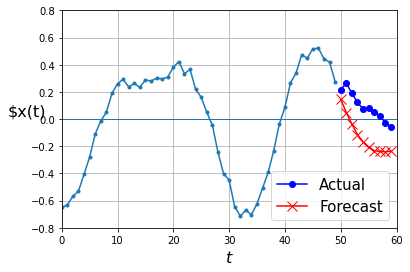

In [87]:
plot_multiple_forecasts(X_new, Y_new, Y_pred)

## Deep RNNs with batch norm

In [88]:
model = keras.models.Sequential([
    keras.layers.SimpleRNN(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.BatchNormalization(),
    keras.layers.SimpleRNN(20, return_sequences=True),
    keras.layers.BatchNormalization(),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 40s 173ms/step - loss: 0.1313 - last_time_step_mse: 0.1120 - val_loss: 0.0654 - val_last_time_step_mse: 0.0583
Epoch 2/20
219/219 [==============================] - 36s 165ms/step - loss: 0.0398 - last_time_step_mse: 0.0277 - val_loss: 0.0385 - val_last_time_step_mse: 0.0286
Epoch 3/20
219/219 [==============================] - 37s 168ms/step - loss: 0.0339 - last_time_step_mse: 0.0225 - val_loss: 0.0341 - val_last_time_step_mse: 0.0239
Epoch 4/20
219/219 [==============================] - 38s 173ms/step - loss: 0.0313 - last_time_step_mse: 0.0202 - val_loss: 0.0298 - val_last_time_step_mse: 0.0194
Epoch 5/20
219/219 [==============================] - 38s 172ms/step - loss: 0.0292 - last_time_step_mse: 0.0184 - val_loss: 0.0289 - val_last_time_step_mse: 0.0191
Epoch 6/20
219/219 [==============================] - 37s 168ms/step - loss: 0.0280 - last_time_step_mse: 0.0179 - val_loss: 0.0309 - val_last_time_step_mse: 0.0230
Epoch 7/20

## Deep RNNs with layer normalization

In [95]:
from tensorflow.keras.layers import LayerNormalization

class LNSimpleRNNCell(keras.layers.Layer):
    def __init__(self, units, activation="tanh", **kwargs):
        super().__init__(**kwargs)
        self.state_size = units
        self.output_size = units
        self.simple_rnn_cell = keras.layers.SimpleRNNCell(units, activation=None)
        self.layer_norm = LayerNormalization()
        self.activation = keras.activations.get(activation)
    def get_initial_state(self, inputs=None, batch_size=None, dtype=None):
        if inputs is not None:
            batch_size = tf.shape(inputs)[0]
            dtype = inputs.dtype
        return [tf.zeros([batch_size, self.state_size], dtype=dtype)]
    def call(self, inputs, states):
        outputs, new_states = self.simple_rnn_cell(inputs, states)
        normalization_output = self.activation(self.layer_norm(outputs))
        return normalization_output, [normalization_output]

In [96]:
model = keras.models.Sequential([
    keras.layers.RNN(LNSimpleRNNCell(20), return_sequences=True,
                     input_shape=[None, 1]),
    keras.layers.RNN(LNSimpleRNNCell(20), return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 80s 342ms/step - loss: 0.1491 - last_time_step_mse: 0.1368 - val_loss: 0.0503 - val_last_time_step_mse: 0.0319
Epoch 2/20
219/219 [==============================] - 75s 343ms/step - loss: 0.0469 - last_time_step_mse: 0.0322 - val_loss: 0.0418 - val_last_time_step_mse: 0.0272
Epoch 3/20
219/219 [==============================] - 80s 363ms/step - loss: 0.0353 - last_time_step_mse: 0.0217 - val_loss: 0.0314 - val_last_time_step_mse: 0.0183
Epoch 4/20
219/219 [==============================] - 81s 371ms/step - loss: 0.0323 - last_time_step_mse: 0.0175 - val_loss: 0.0292 - val_last_time_step_mse: 0.0154
Epoch 5/20
219/219 [==============================] - 82s 376ms/step - loss: 0.0276 - last_time_step_mse: 0.0150 - val_loss: 0.0263 - val_last_time_step_mse: 0.0143
Epoch 6/20
219/219 [==============================] - 78s 357ms/step - loss: 0.0254 - last_time_step_mse: 0.0138 - val_loss: 0.0246 - val_last_time_step_mse: 0.0133
Epoch 7/20

## Creating Custom RNN Classes

In [100]:
class MyRNN(keras.layers.Layer):
    def __init__(self, cell, return_sequences=False, **kwargs):
        super().__init__(**kwargs)
        self.cell = cell
        self.return_sequences = return_sequences
        self.get_initial_state = getattr(self.cell, "get_initial_state", self.fallback_initial_state)
    def fallback_initial_state(self, inputs):
        batch_size = tf.shape(inputs)[0]
        return [tf.zeros([batch_size, self.cell.state_size], dtype=inputs.dtype)]
    @tf.function
    def call(self, inputs):
        states = self.get_initial_state(inputs)
        shape = tf.shape(inputs)
        batch_size = shape[0]
        n_steps = shape[1]
        sequences = tf.TensorArray(inputs.dtype, size=(n_steps if self.return_sequences else 0))
        outputs = tf.zeros(shape=[batch_size, self.cell.output_size], dtype=inputs.dtype)
        for step in tf.range(n_steps):
            outputs, states = self.cell(inputs[:, step], states)
            if self.return_sequences:
                sequences = sequences.write(step, outputs)
        if self.return_sequences:
            return tf.transpose(sequences.stack(), [1, 0, 2])
        else:
            return outputs

In [101]:
model = keras.models.Sequential([
    MyRNN(LNSimpleRNNCell(20), return_sequences=True,
          input_shape=[None, 1]),
    MyRNN(LNSimpleRNNCell(20), return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 72s 326ms/step - loss: 0.1777 - last_time_step_mse: 0.1503 - val_loss: 0.0717 - val_last_time_step_mse: 0.0592
Epoch 2/20
219/219 [==============================] - 70s 318ms/step - loss: 0.0578 - last_time_step_mse: 0.0466 - val_loss: 0.0487 - val_last_time_step_mse: 0.0378
Epoch 3/20
219/219 [==============================] - 72s 328ms/step - loss: 0.0449 - last_time_step_mse: 0.0345 - val_loss: 0.0404 - val_last_time_step_mse: 0.0292
Epoch 4/20
219/219 [==============================] - 73s 332ms/step - loss: 0.0404 - last_time_step_mse: 0.0315 - val_loss: 0.0367 - val_last_time_step_mse: 0.0279
Epoch 5/20
219/219 [==============================] - 71s 325ms/step - loss: 0.0348 - last_time_step_mse: 0.0256 - val_loss: 0.0325 - val_last_time_step_mse: 0.0228
Epoch 6/20
219/219 [==============================] - 70s 318ms/step - loss: 0.0315 - last_time_step_mse: 0.0216 - val_loss: 0.0297 - val_last_time_step_mse: 0.0193
Epoch 7/20

## Example of LSTMs

In [102]:
model = keras.models.Sequential([
    keras.layers.LSTM(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.LSTM(20, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 6s 13ms/step - loss: 0.0703 - last_time_step_mse: 0.0544 - val_loss: 0.0394 - val_last_time_step_mse: 0.0168
Epoch 2/20
219/219 [==============================] - 2s 8ms/step - loss: 0.0348 - last_time_step_mse: 0.0150 - val_loss: 0.0314 - val_last_time_step_mse: 0.0117
Epoch 3/20
219/219 [==============================] - 2s 8ms/step - loss: 0.0297 - last_time_step_mse: 0.0119 - val_loss: 0.0281 - val_last_time_step_mse: 0.0108
Epoch 4/20
219/219 [==============================] - 2s 8ms/step - loss: 0.0272 - last_time_step_mse: 0.0109 - val_loss: 0.0262 - val_last_time_step_mse: 0.0106
Epoch 5/20
219/219 [==============================] - 2s 8ms/step - loss: 0.0253 - last_time_step_mse: 0.0101 - val_loss: 0.0247 - val_last_time_step_mse: 0.0110
Epoch 6/20
219/219 [==============================] - 2s 8ms/step - loss: 0.0238 - last_time_step_mse: 0.0097 - val_loss: 0.0239 - val_last_time_step_mse: 0.0117
Epoch 7/20
219/219 [=======

In [103]:
model.evaluate(X_valid, Y_valid)

63/63 [==============================] - 0s 4ms/step - loss: 0.0173 - last_time_step_mse: 0.0066


[0.017266416922211647, 0.00660356180742383]

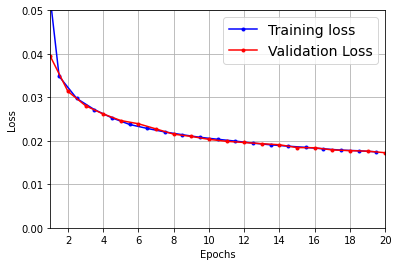

In [104]:
plot_learning_curves(history.history["loss"], history.history["val_loss"])
plt.show()

In [106]:
np.random.seed(43)

series = generate_dataset(1, 50 + 10)
X_new, Y_new = series[:, :50, :], series[:, 50:, :]
Y_pred = model.predict(X_new)[:, -1][..., np.newaxis]

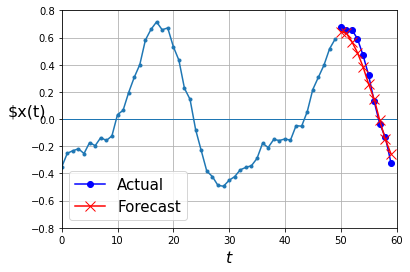

In [107]:
plot_multiple_forecasts(X_new, Y_new, Y_pred)
plt.show()

## GRU (Gated Recurrent Units) in RNN models

In [108]:
model = keras.models.Sequential([
    keras.layers.GRU(20, return_sequences=True, input_shape=[None, 1]),
    keras.layers.GRU(20, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 4s 9ms/step - loss: 0.0626 - last_time_step_mse: 0.0547 - val_loss: 0.0369 - val_last_time_step_mse: 0.0265
Epoch 2/20
219/219 [==============================] - 1s 7ms/step - loss: 0.0341 - last_time_step_mse: 0.0235 - val_loss: 0.0317 - val_last_time_step_mse: 0.0215
Epoch 3/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0303 - last_time_step_mse: 0.0194 - val_loss: 0.0287 - val_last_time_step_mse: 0.0174
Epoch 4/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0277 - last_time_step_mse: 0.0168 - val_loss: 0.0266 - val_last_time_step_mse: 0.0155
Epoch 5/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0260 - last_time_step_mse: 0.0154 - val_loss: 0.0248 - val_last_time_step_mse: 0.0151
Epoch 6/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0244 - last_time_step_mse: 0.0147 - val_loss: 0.0232 - val_last_time_step_mse: 0.0138
Epoch 7/20
219/219 [========

In [109]:
model.evaluate(X_valid, Y_valid)

63/63 [==============================] - 0s 3ms/step - loss: 0.0172 - last_time_step_mse: 0.0086


[0.01724233850836754, 0.008592139929533005]

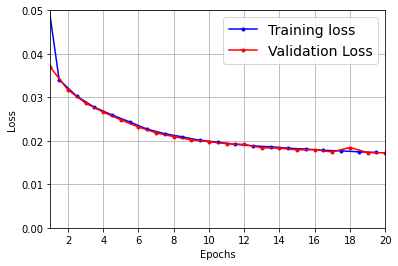

In [110]:
plot_learning_curves(history.history["loss"], history.history["val_loss"])
plt.show()

In [111]:
series = generate_dataset(1, 50 + 10)
X_new, Y_new = series[:, :50, :], series[:, 50:, :]
Y_pred = model.predict(X_new)[:, -1][..., np.newaxis]

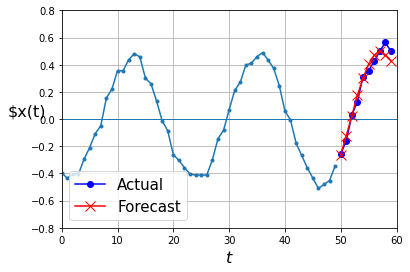

In [112]:
plot_multiple_forecasts(X_new, Y_new, Y_pred)
plt.show()

## Using One-Diemnsional Convolutional Layers to Process Sequences

In [113]:
model = keras.models.Sequential([
    keras.layers.Conv1D(filters=20, kernel_size=4, strides=2, padding="valid",
                        input_shape=[None, 1]),
    keras.layers.GRU(20, return_sequences=True),
    keras.layers.GRU(20, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(10))
])

model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train[:, 3::2], epochs=20,
                    validation_data=(X_valid, Y_valid[:, 3::2]))

Epoch 1/20
219/219 [==============================] - 12s 11ms/step - loss: 0.0555 - last_time_step_mse: 0.0474 - val_loss: 0.0310 - val_last_time_step_mse: 0.0229
Epoch 2/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0246 - last_time_step_mse: 0.0179 - val_loss: 0.0210 - val_last_time_step_mse: 0.0149
Epoch 3/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0204 - last_time_step_mse: 0.0143 - val_loss: 0.0198 - val_last_time_step_mse: 0.0145
Epoch 4/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0192 - last_time_step_mse: 0.0134 - val_loss: 0.0184 - val_last_time_step_mse: 0.0126
Epoch 5/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0182 - last_time_step_mse: 0.0122 - val_loss: 0.0177 - val_last_time_step_mse: 0.0116
Epoch 6/20
219/219 [==============================] - 2s 8ms/step - loss: 0.0176 - last_time_step_mse: 0.0116 - val_loss: 0.0170 - val_last_time_step_mse: 0.0111
Epoch 7/20
219/219 [======

## WaveNet

#### WaveNet Visualization


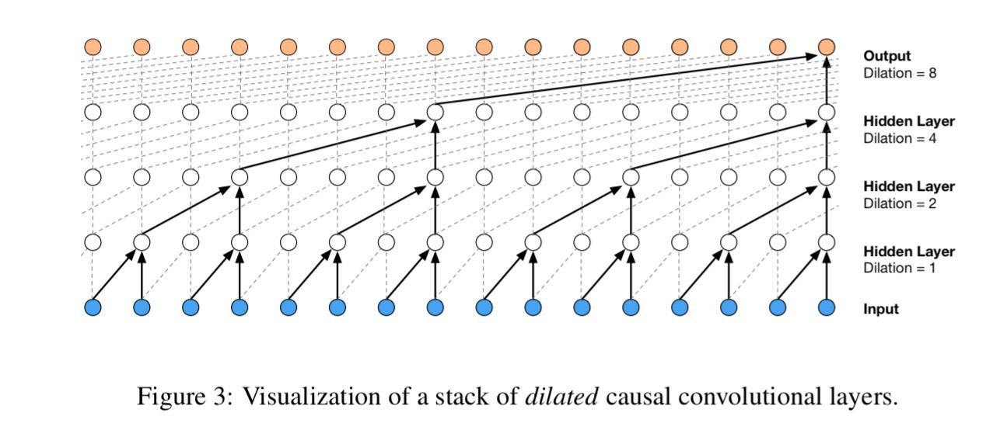

In [114]:
model = keras.models.Sequential()
model.add(keras.layers.InputLayer(input_shape=[None, 1]))
for rate in (1, 2, 4, 8) * 2:
    model.add(keras.layers.Conv1D(filters=20, kernel_size=2, padding="causal",
                                  activation="relu", dilation_rate=rate))
model.add(keras.layers.Conv1D(filters=10, kernel_size=1))
model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=20,
                    validation_data=(X_valid, Y_valid))

Epoch 1/20
219/219 [==============================] - 4s 10ms/step - loss: 0.0586 - last_time_step_mse: 0.0484 - val_loss: 0.0262 - val_last_time_step_mse: 0.0155
Epoch 2/20
219/219 [==============================] - 2s 7ms/step - loss: 0.0229 - last_time_step_mse: 0.0129 - val_loss: 0.0219 - val_last_time_step_mse: 0.0133
Epoch 3/20
219/219 [==============================] - 2s 9ms/step - loss: 0.0201 - last_time_step_mse: 0.0112 - val_loss: 0.0195 - val_last_time_step_mse: 0.0111
Epoch 4/20
219/219 [==============================] - 2s 9ms/step - loss: 0.0189 - last_time_step_mse: 0.0102 - val_loss: 0.0187 - val_last_time_step_mse: 0.0102
Epoch 5/20
219/219 [==============================] - 2s 10ms/step - loss: 0.0183 - last_time_step_mse: 0.0098 - val_loss: 0.0175 - val_last_time_step_mse: 0.0090
Epoch 6/20
219/219 [==============================] - 2s 10ms/step - loss: 0.0179 - last_time_step_mse: 0.0096 - val_loss: 0.0171 - val_last_time_step_mse: 0.0087
Epoch 7/20
219/219 [=====

In [121]:
class GatedActivationUnit(keras.layers.Layer):
    def __init__(self, activation='tanh', **kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
    def call(self, inputs):
        n_filters = inputs.shape[-1] // 2
        linear_output = self.activation(inputs[..., :n_filters])
        gate = keras.activations.sigmoid(inputs[..., n_filters:])
        return self.activation(linear_output) * gate

In [122]:
def wavenet_residual_block(inputs, n_filters, dilation_rate):
    z = keras.layers.Conv1D(2 * n_filters, kernel_size=2, padding='causal',
                           dilation_rate=dilation_rate)(inputs)
    z = GatedActivationUnit()(z)
    z = keras.layers.Conv1D(n_filters, kernel_size=1)(z)
    return keras.layers.Add()([z, inputs]), z

In [123]:
n_layers_per_block = 3 # 10 in the paper
n_blocks = 1 # 3 in the paper
n_filters = 32 # 128 in the paper
n_outputs = 10 # 256 in the paper

inputs = keras.layers.Input(shape=[None, 1])
z = keras.layers.Conv1D(n_filters, kernel_size=2, padding="causal")(inputs)
skip_to_last = []
for dilation_rate in [2**i for i in range(n_layers_per_block)] * n_blocks:
    z, skip = wavenet_residual_block(z, n_filters, dilation_rate)
    skip_to_last.append(skip)
z = keras.activations.relu(keras.layers.Add()(skip_to_last))
z = keras.layers.Conv1D(n_filters, kernel_size=1, activation="relu")(z)
Y_proba = keras.layers.Conv1D(n_outputs, kernel_size=1, activation="softmax")(z)

model = keras.models.Model(inputs=[inputs], outputs=[Y_proba])

In [124]:
model.compile(loss="mse", optimizer="adam", metrics=[last_time_step_mse])
history = model.fit(X_train, Y_train, epochs=2,
                    validation_data=(X_valid, Y_valid))

Epoch 1/2
219/219 [==============================] - 3s 10ms/step - loss: 0.1277 - last_time_step_mse: 0.1219 - val_loss: 0.1220 - val_last_time_step_mse: 0.1145
Epoch 2/2
219/219 [==============================] - 2s 8ms/step - loss: 0.1211 - last_time_step_mse: 0.1151 - val_loss: 0.1213 - val_last_time_step_mse: 0.1139


# End of Chapter Exercises

1. Can you think of a few applications for a sequence-to-sequence RNN? What
about a sequence-to-vector RNN, and a vector-to-sequence RNN?
2. How many dimensions must the inputs of an RNN layer have? What does each
dimension represent? What about its outputs?
3. If you want to build a deep sequence-to-sequence RNN, which RNN layers
should have return_sequences=True? What about a sequence-to-vector RNN?
4. Suppose you have a daily univariate time series, and you want to forecast the next
seven days. Which RNN architecture should you use?
5. What are the main difficulties when training RNNs? How can you handle them?
6. Can you sketch the LSTM cell’s architecture?
7. Why would you want to use 1D convolutional layers in an RNN?
8. Which neural network architecture could you use to classify videos?
9. Train a classification model for the SketchRNN dataset, available in TensorFlow
Datasets.
10. Download the Bach chorales dataset and unzip it. It is composed of 382 chorales
composed by Johann Sebastian Bach. Each chorale is 100 to 640 time steps long,
and each time step contains 4 integers, where each integer corresponds to a note’s
index on a piano (except for the value 0, which means that no note is played).
Train a model—recurrent, convolutional, or both—that can predict the next time
step (four notes), given a sequence of time steps from a chorale. Then use this
model to generate Bach-like music, one note at a time: you can do this by giving
the model the start of a chorale and asking it to predict the next time step, then
appending these time steps to the input sequence and asking the model for the
next note, and so on. Also make sure to check out Google’s Coconet model,
which was used for a nice Google doodle about Bach.


***1. Can you think of a few applications for a sequence-to-sequence RNN? What
about a sequence-to-vector RNN, and a vector-to-sequence RNN?***

A: Sequence-to-Sequence RNNs: Stock Market Prediction, Speech Recognition.

Sequence-to-Vector RNNs: Sentiment Analysis

Vector-to-Sequence RNNs: Image Captioning


***2. How many dimensions must the inputs of an RNN layer have? What does each
dimension represent? What about its outputs?***

A: RNN layers need three-dimensional inputs consisting of the batch size, time steps and input features per time step. So if you wanted 10 time series, with 10 steps and 5 values per step, the input dimension would look like the following: [10, 10, 2]. The outputs are relatively the same, but the last dimension is equal to the number of neurons. So with 18 neurons we would have [10, 10, 32].

***3. If you want to build a deep sequence-to-sequence RNN, which RNN layers
should have return_sequences=True? What about a sequence-to-vector RNN?***

A: ALL RNN layers should have return sequences for a deep sequence-to-sequence. For a sequence-to-vector everything but the top layer should be set to true.

***4. Suppose you have a daily univariate time series, and you want to forecast the next
seven days. Which RNN architecture should you use?***

A: In this scenario, you could use a stack of RNN layers with seven output neurons in the output layer. You could then use a previous timeline (ex. last two weeks of 14 days) as inputs and use 7 day periods after each day to predict the next seven days as the target output. 

***5. What are the main difficulties when training RNNs? How can you handle them?***

A: Unstable Gradients (Either Vanishing or Exploding) and a short-term memory problem. Smaller learning rates can help with unstable gradients and using the hyperbolic tangent function (preferred). Other things that can help are gradient clipping, Layer Normalization and dropout at each time step. For the short term memory problem, use a LSTM (even a GRU if necessary) for layers in RNN. 

***6. Can you sketch the LSTM cell’s architecture?***

A: 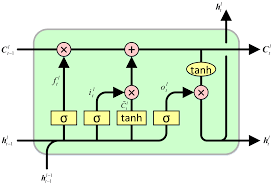

***7. Why would you want to use 1D convolutional layers in an RNN?***

A: You could use a 1D Convolutional layer because it helps fight against unstable gradients because it isn't recurrent. You could also use 1D layers to help with preprocessing inputs (could even assist using strides on inputs for images for example). Finally, RNN layers are sequential so they have to be run in sequence. Therefore you cannot utilize multiple cores or subsets to run in parallel when training. This is where 1D conv layers can help as this isn't necessary. 

***8. Which neural network architecture could you use to classify videos?***

A: One recommended Vidio Classification Model that Keras recommends in Computer Vision is to use a CNN for each from of the video. From this, we will generate a sequence of outputs and because this is a sequence, we would then feed it to a sequence-to-vector RNN. Or alternatively we could use a pretrained model to stack with GRU layers. But if we stick with the sequence-to-vector RNN, we can have the output of the RNN for what we are trying to classify if it binary classification we would use a sigmoid layer, otherwise for multi-classification we can then use a softmax.

In [1]:
# Question #9
'''9. Train a classification model for the SketchRNN dataset, available in TensorFlow
Datasets.'''

import tensorflow as tf
import os
from tensorflow import keras
import numpy as np
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

DOWNLOAD_ROOT = "http://download.tensorflow.org/data/"
FILENAME = "quickdraw_tutorial_dataset_v1.tar.gz"
filepath = keras.utils.get_file(FILENAME,
                                DOWNLOAD_ROOT + FILENAME,
                                cache_subdir="datasets/quickdraw",
                                extract=True)

In [2]:
from pathlib import Path

directory_parent = Path(filepath).parent
training_file = sorted([str(path) for path in directory_parent.glob("training.tfrecord-*")])
evaluation_file = sorted([str(path) for path in directory_parent.glob("eval.tfrecord-*")])

training_file

['C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00000-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00001-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00002-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00003-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00004-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00005-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00006-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00007-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00008-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\training.tfrecord-00009-of-00010']

In [3]:
evaluation_file

['C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00000-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00001-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00002-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00003-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00004-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00005-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00006-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00007-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00008-of-00010',
 'C:\\Users\\User\\.keras\\datasets\\quickdraw\\eval.tfrecord-00009-of-00010']

In [4]:
with open(directory_parent / "eval.tfrecord.classes") as test_classes_file:
    test_classes = test_classes_file.readlines()
    
with open(directory_parent / "training.tfrecord.classes") as train_classes_file:
    train_classes = train_classes_file.readlines()

In [5]:
assert train_classes == test_classes
class_names = [name.strip().lower() for name in train_classes]

In [6]:
sorted(class_names)

['aircraft carrier',
 'airplane',
 'alarm clock',
 'ambulance',
 'angel',
 'animal migration',
 'ant',
 'anvil',
 'apple',
 'arm',
 'asparagus',
 'axe',
 'backpack',
 'banana',
 'bandage',
 'barn',
 'baseball',
 'baseball bat',
 'basket',
 'basketball',
 'bat',
 'bathtub',
 'beach',
 'bear',
 'beard',
 'bed',
 'bee',
 'belt',
 'bench',
 'bicycle',
 'binoculars',
 'bird',
 'birthday cake',
 'blackberry',
 'blueberry',
 'book',
 'boomerang',
 'bottlecap',
 'bowtie',
 'bracelet',
 'brain',
 'bread',
 'bridge',
 'broccoli',
 'broom',
 'bucket',
 'bulldozer',
 'bus',
 'bush',
 'butterfly',
 'cactus',
 'cake',
 'calculator',
 'calendar',
 'camel',
 'camera',
 'camouflage',
 'campfire',
 'candle',
 'cannon',
 'canoe',
 'car',
 'carrot',
 'castle',
 'cat',
 'ceiling fan',
 'cell phone',
 'cello',
 'chair',
 'chandelier',
 'church',
 'circle',
 'clarinet',
 'clock',
 'cloud',
 'coffee cup',
 'compass',
 'computer',
 'cookie',
 'cooler',
 'couch',
 'cow',
 'crab',
 'crayon',
 'crocodile',
 'crow

In [7]:
def parser(data):
    feature_descriptions = {
        "ink": tf.io.VarLenFeature(dtype=tf.float32),
        "shape": tf.io.FixedLenFeature([2], dtype=tf.int64),
        "class_index": tf.io.FixedLenFeature([1], dtype=tf.int64)
    }
    examples = tf.io.parse_example(data, feature_descriptions)
    flat_sketches = tf.sparse.to_dense(examples["ink"])
    sketches = tf.reshape(flat_sketches, shape=[tf.size(data), -1, 3])
    lengths = examples["shape"][:, 0]
    labels = examples["class_index"][:, 0]
    return sketches, lengths, labels

In [8]:
def grab_dataset(filepaths, batch_size=32, shuffle_buffer_size=None,
                      n_parse_threads=5, n_read_threads=5, cache=False):
    dataset = tf.data.TFRecordDataset(filepaths,
                                      num_parallel_reads=n_read_threads)
    if cache:
        dataset = dataset.cache()
    if shuffle_buffer_size:
        dataset = dataset.shuffle(shuffle_buffer_size)
    dataset = dataset.batch(batch_size)
    dataset = dataset.map(parser, num_parallel_calls=n_parse_threads)
    return dataset.prefetch(1)

In [9]:
training_set = grab_dataset(training_file, shuffle_buffer_size=10000)
val_set = grab_dataset(evaluation_file[:5])
testing_set = grab_dataset(evaluation_file[5:])

In [10]:
for a, b, c in training_set.take(1):
    print("sketches =", a)
    print("lengths =", b)
    print("labels =", c)

sketches = tf.Tensor(
[[[ 0.          0.11111112  1.        ]
  [ 0.         -0.12345679  0.        ]
  [ 0.07450983 -0.03703704  0.        ]
  ...
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]]

 [[-0.26274508  0.147929    0.        ]
  [-0.10980392  0.11242604  0.        ]
  [-0.02352941  0.04733726  0.        ]
  ...
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]]

 [[ 0.05490196 -0.08040196  0.        ]
  [ 0.06666666 -0.14572865  0.        ]
  [ 0.08235294 -0.13065329  0.        ]
  ...
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]]

 ...

 [[-0.13385826  0.18181819  0.        ]
  [-0.04330709  0.11570248  0.        ]
  [-0.04330709  0.19008264  0.        ]
  ...
  [ 0.          0.          0.        ]
  [ 0.          0.          0.        ]
  [ 0.          0.    

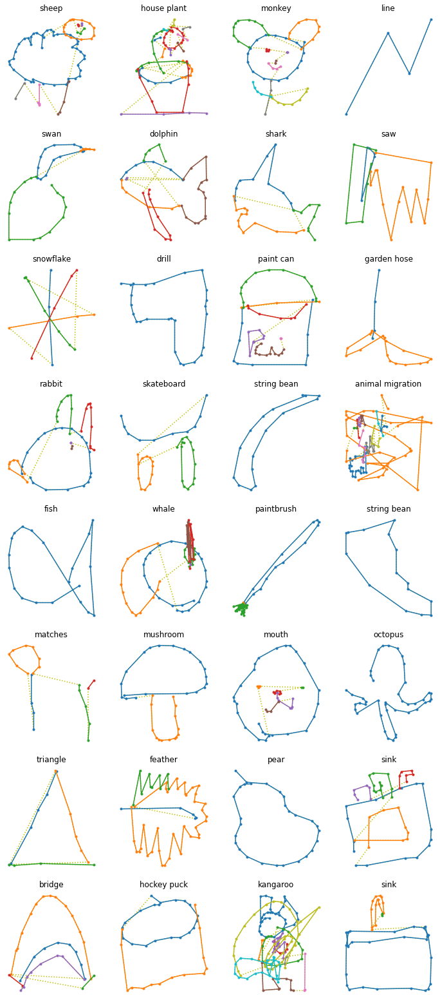

In [11]:
def draw_image(raw_sketch, labels=None):
    sketch_origin = np.array([[0., 0., 0]])
    sketch = np.r_[sketch_origin, raw_sketch]
    end_indices = np.argwhere(sketch[:, -1]==1.)[:, 0]
    coordinates = np.cumsum(sketch[:, :2], axis=0)
    strokes = np.split(coordinates, end_indices + 1)
    title = class_names[labels.numpy()] if labels is not None else "Try to guess"
    plt.title(title)
    plt.plot(coordinates[:, 0], -coordinates[:, 1], "y:")
    for stroke in strokes:
        plt.plot(stroke[:, 0], -stroke[:, 1], ".-")
    plt.axis("off")
    
def draw_sketches(sketches, lengths, labels):
    n_sketches = len(sketches)
    n_cols = 4
    n_rows = (n_sketches - 1) // n_cols + 1
    plt.figure(figsize=(n_cols * 3, n_rows * 3.5))
    for index, sketch, length, label in zip(range(n_sketches), sketches, lengths, labels):
        plt.subplot(n_rows, n_cols, index + 1)
        draw_image(sketch[:length], label)
    plt.show()
    
for sketches, lengths, labels in training_set.take(1):
    draw_sketches(sketches, lengths, labels)
    

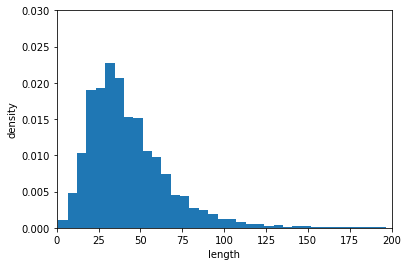

In [12]:
# length/density distribution 
lengths = np.concatenate([lengths for _, lengths, _ in training_set.take(1000)])
plt.hist(lengths, bins=150, density=True)
plt.axis([0, 200, 0, 0.03])
plt.xlabel("length")
plt.ylabel("density")
plt.show()

Now from these images, we can crop them using a lambda function that lets us us grab anything less than say 125 for the length based on our graph above. Let us do that now:

In [23]:
def crop_long_sketches(dataset, max_length=125):
    return dataset.map(lambda inks, lengths, labels: (inks[:, :max_length], labels))

cropped_train_set = crop_long_sketches(training_set)
cropped_valid_set = crop_long_sketches(val_set)
cropped_test_set = crop_long_sketches(testing_set)

In [32]:
# Now for the model 
model = keras.models.Sequential([
    keras.layers.Conv1D(32, kernel_size=5, strides=2, activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv1D(64, kernel_size=5, strides=2, activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv1D(128, kernel_size=3, strides=2, activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.LSTM(128, return_sequences=True),
    keras.layers.LSTM(128),
    keras.layers.Dense(len(class_names), activation="softmax")    
])
optimizer = keras.optimizers.SGD(learning_rate=10e-2, clipnorm=1.)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics = ["accuracy", "sparse_top_k_categorical_accuracy"])
history = model.fit(cropped_train_set, epochs=5, batch_size=32,
                   validation_data=cropped_valid_set)

Epoch 1/5
107813/107813 [==============================] - 2357s 22ms/step - loss: 2.5566 - accuracy: 0.4136 - sparse_top_k_categorical_accuracy: 0.6840 - val_loss: 1.9286 - val_accuracy: 0.5294 - val_sparse_top_k_categorical_accuracy: 0.8032
Epoch 2/5
107813/107813 [==============================] - 2683s 25ms/step - loss: 1.7833 - accuracy: 0.5612 - sparse_top_k_categorical_accuracy: 0.8248 - val_loss: 1.7651 - val_accuracy: 0.5637 - val_sparse_top_k_categorical_accuracy: 0.8285
Epoch 3/5
107813/107813 [==============================] - 3581s 33ms/step - loss: 1.6377 - accuracy: 0.5932 - sparse_top_k_categorical_accuracy: 0.8462 - val_loss: 1.5828 - val_accuracy: 0.6062 - val_sparse_top_k_categorical_accuracy: 0.8541
Epoch 4/5
107813/107813 [==============================] - 2355s 22ms/step - loss: 1.5609 - accuracy: 0.6104 - sparse_top_k_categorical_accuracy: 0.8570 - val_loss: 1.5386 - val_accuracy: 0.6174 - val_sparse_top_k_categorical_accuracy: 0.8596
Epoch 5/5
107813/107813 [===

In [33]:
y_test = np.concatenate([labels for _, _, labels in testing_set])
y_probas = model.predict(testing_set)

In [34]:
np.mean(keras.metrics.sparse_top_k_categorical_accuracy(y_test, y_probas))

0.86497265

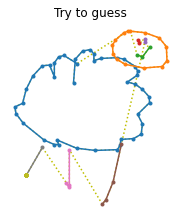

Top-5 predictions:
  1. sheep 99.709%
  2. rain 0.222%
  3. tree 0.006%
  4. bear 0.006%
  5. hedgehog 0.005%
Answer: sheep


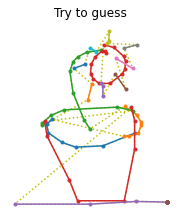

Top-5 predictions:
  1. microphone 26.619%
  2. mermaid 18.479%
  3. yoga 11.924%
  4. sink 5.395%
  5. lighthouse 2.416%
Answer: house plant


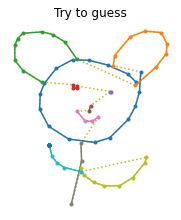

Top-5 predictions:
  1. monkey 83.562%
  2. teddy-bear 7.772%
  3. bear 4.739%
  4. rabbit 0.928%
  5. panda 0.855%
Answer: monkey


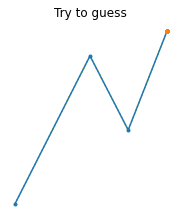

Top-5 predictions:
  1. line 82.311%
  2. mountain 0.716%
  3. matches 0.570%
  4. ocean 0.451%
  5. sword 0.406%
Answer: line


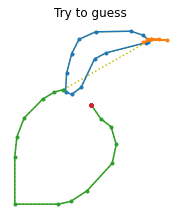

Top-5 predictions:
  1. parrot 72.017%
  2. bird 6.007%
  3. penguin 4.981%
  4. duck 2.920%
  5. swan 2.289%
Answer: swan


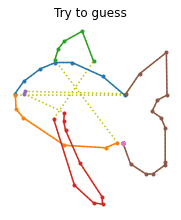

Top-5 predictions:
  1. sea turtle 35.392%
  2. airplane 30.193%
  3. aircraft carrier 5.681%
  4. dolphin 2.961%
  5. shark 2.946%
Answer: dolphin


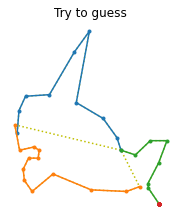

Top-5 predictions:
  1. shark 78.300%
  2. sword 4.987%
  3. dolphin 4.139%
  4. crocodile 1.413%
  5. whale 1.191%
Answer: shark


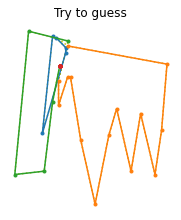

Top-5 predictions:
  1. saw 66.530%
  2. bottlecap 3.718%
  3. bat 2.487%
  4. knife 2.481%
  5. diving board 2.409%
Answer: saw


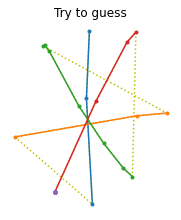

Top-5 predictions:
  1. snowflake 99.783%
  2. star 0.129%
  3. stitches 0.011%
  4. feather 0.009%
  5. sword 0.008%
Answer: snowflake


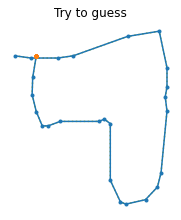

Top-5 predictions:
  1. underwear 99.227%
  2. anvil 0.449%
  3. drill 0.133%
  4. axe 0.039%
  5. tooth 0.030%
Answer: drill


In [35]:
n_new = 10
Y_probas = model.predict(sketches)
top_k = tf.nn.top_k(Y_probas, k=5)
for index in range(n_new):
    plt.figure(figsize=(3, 3.5))
    draw_image(sketches[index])
    plt.show()
    print("Top-5 predictions:".format(index + 1))
    for k in range(5):
        class_name = class_names[top_k.indices[index, k]]
        proba = 100 * top_k.values[index, k]
        print("  {}. {} {:.3f}%".format(k + 1, class_name, proba))
    print("Answer: {}".format(class_names[labels[index].numpy()]))

In [36]:
model.save("RNNSketchModel")

INFO:tensorflow:Assets written to: RNNSketchModel\assets


INFO:tensorflow:Assets written to: RNNSketchModel\assets


In [3]:
# Exercise 10
'''10. Download the Bach chorales dataset and unzip it. It is composed of 382 chorales
composed by Johann Sebastian Bach. Each chorale is 100 to 640 time steps long,
and each time step contains 4 integers, where each integer corresponds to a note’s
index on a piano (except for the value 0, which means that no note is played).
Train a model—recurrent, convolutional, or both—that can predict the next time
step (four notes), given a sequence of time steps from a chorale. Then use this
model to generate Bach-like music, one note at a time: you can do this by giving
the model the start of a chorale and asking it to predict the next time step, then
appending these time steps to the input sequence and asking the model for the
next note, and so on. Also make sure to check out Google’s Coconet model,
which was used for a nice Google doodle about Bach.'''

DOWNLOAD_ROOT = "https://github.com/ageron/handson-ml2/raw/master/datasets/jsb_chorales/"
FILENAME = "jsb_chorales.tgz"
filepath = keras.utils.get_file(FILENAME,
                                DOWNLOAD_ROOT + FILENAME,
                                cache_subdir="datasets/jsb_chorales",
                                extract=True)

In [4]:
jsb_chorales_dir = Path(filepath).parent
training_files = sorted(jsb_chorales_dir.glob("train/chorale_*.csv"))
val_files = sorted(jsb_chorales_dir.glob("valid/chorale_*.csv"))
testing_files = sorted(jsb_chorales_dir.glob("test/chorale_*.csv"))

In [5]:
import pandas as pd

def load_chorales(filepaths):
    return [pd.read_csv(filepath).values.tolist() for filepath in filepaths]

training_chorales = load_chorales(training_files)
val_chorales = load_chorales(val_files)
testing_chorales = load_chorales(testing_files)

In [6]:
# Example of first value in training chorales list
def minmax(val_list):
    min_val = min(val_list)
    max_val = max(val_list)

    return (min_val, max_val)

minmax(training_chorales)

([[62, 0, 0, 0],
  [62, 0, 0, 0],
  [62, 0, 0, 0],
  [62, 0, 0, 0],
  [62, 57, 53, 50],
  [62, 57, 53, 50],
  [62, 57, 55, 52],
  [62, 57, 55, 52],
  [69, 62, 57, 53],
  [69, 62, 57, 53],
  [69, 65, 57, 50],
  [69, 65, 57, 50],
  [67, 65, 62, 58],
  [67, 65, 62, 58],
  [67, 64, 55, 58],
  [67, 62, 55, 58],
  [69, 64, 55, 49],
  [69, 64, 55, 49],
  [69, 64, 53, 49],
  [69, 64, 52, 49],
  [64, 64, 57, 49],
  [64, 64, 57, 49],
  [64, 62, 57, 47],
  [64, 61, 57, 45],
  [65, 62, 57, 50],
  [65, 62, 57, 50],
  [65, 62, 57, 52],
  [65, 62, 57, 52],
  [65, 62, 57, 53],
  [65, 62, 57, 53],
  [65, 62, 57, 50],
  [65, 62, 57, 50],
  [64, 62, 57, 45],
  [64, 62, 57, 45],
  [64, 62, 57, 45],
  [64, 62, 57, 45],
  [64, 61, 57, 45],
  [64, 61, 57, 45],
  [64, 61, 57, 45],
  [64, 61, 57, 45],
  [67, 61, 57, 45],
  [67, 61, 57, 45],
  [67, 61, 57, 45],
  [67, 61, 57, 45],
  [67, 62, 50, 47],
  [67, 62, 50, 47],
  [67, 64, 57, 49],
  [67, 64, 57, 49],
  [65, 64, 57, 50],
  [65, 64, 57, 50],
  [65, 62, 5

According to the author of this book, The above shows the range of notes based on their octaves. Each chord is composed of 4 integers, which represent a index of a note on the piano. They are supposed to range from 36 (C1 on octave 1) to 81 (A5 on octave 5). Typically, This would mean that we are starting from the C Major Scale. So one octave would go C,D,E,F,G,A,B and back to C again to represent **1 Octave**. In our case. We have 5 Octaves. and 0 for silence. Let us now set our min and max notes and set notation for our chords in the chorale:

In [9]:
notes = set()
for chorales in (training_chorales, val_chorales, testing_chorales):
    for chorale in chorales:
        for chord in chorale:
            notes |= set(chord)
            
n_notes = len(notes)
min_note = min(notes - {0})
max_note = max(notes)

assert min_note == 36
assert max_note == 81

Now we use the **IPython** Library and import audio and build some functions for us to play some MIDI chords:

In [10]:
from IPython.display import Audio 

def notes_to_frequencies(notes):
    # Typically, frequency doubles when going up one octave and there are 12 semi-tones per octave
    # Note A on octave 4 is 440 Hz, and it is note number 69.
    return 2 ** ((np.array(notes) - 69) / 12) * 440

In [21]:
def frequencies_to_samples(frequencies, tempo, sample_rate):
    note_duration = 60 / tempo # beats per minute
    frequencies = np.round(note_duration * frequencies) / note_duration # rounding to try and get samples close to zero at end of each note
    n_samples = int(note_duration * sample_rate)
    time = np.linspace(0, note_duration, n_samples)
    sine_waves = np.sin(2 * np.pi * frequencies.reshape(-1, 1) * time)
    # now to remove silent notes and frequences less than 9hz
    sine_waves *= (frequencies > 9.).reshape(-1, 1)
    return sine_waves.reshape(-1)

In [22]:
def chords_to_samples(chords, tempo, sample_rate):
    freqs = notes_to_frequencies(chords)
    freqs = np.r_[freqs, freqs[-1:]] # make last note a bit longer
    merged = np.mean([frequencies_to_samples(melody, tempo, sample_rate)
                     for melody in freqs.T], axis=0)
    n_fade_out_samples = sample_rate * 60 // tempo # fade out last note
    fade_out = np.linspace(1., 0., n_fade_out_samples)**2
    merged[-n_fade_out_samples:] *= fade_out
    return merged

def play_chords(chords, tempo=160, amplitude=0.1, sample_rate=44100, filepath=None):
    samples = amplitude * chords_to_samples(chords, tempo, sample_rate)
    if filepath:
        from scipy.io import wavfile
        samples = (2**15 * samples).astype(np.int16)
        wavfile.write(filepath, sample_rate, samples)
        return display(Audio(filepath))
    else:
        return display(Audio(samples, rate=sample_rate))

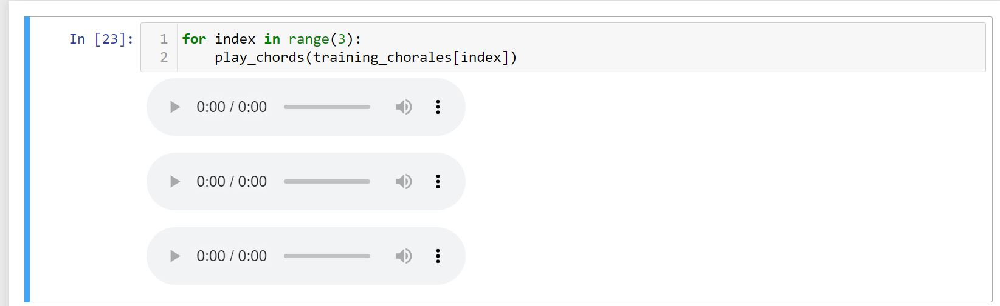

In order to be able to generate new chorales, we want to train a model that can predict the next chord given all the previous chords. If we naively try to predict the next chord in one shot, predicting all 4 notes at once, we run the risk of getting notes that don't go very well together (believe me, I tried). It's much better and simpler to predict one note at a time. So we will need to preprocess every chorale, turning each chord into an arpegio (i.e., a sequence of notes rather than notes played simultaneuously). So each chorale will be a long sequence of notes (rather than chords), and we can just train a model that can predict the next note given all the previous notes. We will use a sequence-to-sequence approach, where we feed a window to the neural net, and it tries to predict that same window shifted one time step into the future.

We will also shift the values so that they range from 0 to 46, where 0 represents silence, and values 1 to 46 represent notes 36 (C1) to 81 (A5).

And we will train the model on windows of 128 notes (i.e., 32 chords).

Since the dataset fits in memory, we could preprocess the chorales in RAM using any Python code we like, but I will demonstrate here how to do all the preprocessing using tf.data (there will be more details about creating windows using tf.data in the next chapter).

In [24]:
def create_target(batch):
    X = batch[:, :-1]
    Y = batch[:, 1:] # predict next note in each arpegio, at each step
    return X, Y

def preprocess(window):
    window = tf.where(window == 0, window, window - min_note + 1) # shift values
    return tf.reshape(window, [-1]) # convert to arpegio

def bach_dataset(chorales, batch_size=32, shuffle_buffer_size=None,
                 window_size=32, window_shift=16, cache=True):
    def batch_window(window):
        return window.batch(window_size + 1)
    
    def to_windows(chorale):
        dataset = tf.data.Dataset.from_tensor_slices(chorale)
        dataset = dataset.window(window_size + 1, window_shift, drop_remainder=True)
        return dataset.flat_map(batch_window)
    
    chorales = tf.ragged.constant(chorales, ragged_rank=1)
    dataset = tf.data.Dataset.from_tensor_slices(chorales)
    dataset = dataset.flat_map(to_windows).map(preprocess)
    if cache:
        dataset = dataset.cache()
    if shuffle_buffer_size:
        dataset = dataset.shuffle(shuffle_buffer_size)
    dataset = dataset.batch(batch_size)
    dataset = dataset.map(create_target)
    return dataset.prefetch(1)  

In [26]:
# now to create datasets
train_set = bach_dataset(training_chorales, shuffle_buffer_size=1000)
valid_set = bach_dataset(val_chorales)
test_set = bach_dataset(testing_chorales)

Now let's create the model:

- We could feed the note values directly to the model, as floats, but this would probably not give good results. Indeed, the relationships between notes are not that simple: for example, if you replace a C3 with a C4, the melody will still sound fine, even though these notes are 12 semi-tones apart (i.e., one octave). Conversely, if you replace a C3 with a C#3, it's very likely that the chord will sound horrible, despite these notes being just next to each other. So we will use an Embedding layer to convert each note to a small vector representation (see Chapter 16 for more details on embeddings). We will use 5-dimensional embeddings, so the output of this first layer will have a shape of [batch_size, window_size, 5].
- We will then feed this data to a small WaveNet-like neural network, composed of a stack of 4 Conv1D layers with doubling dilation rates. We will intersperse these layers with BatchNormalization layers for faster better convergence.
- Then one LSTM layer to try to capture long-term patterns.
- And finally a Dense layer to produce the final note probabilities. It will predict one probability for each chorale in the batch, for each time step, and for each possible note (including silence). So the output shape will be [batch_size, window_size, 47].

In [41]:
n_embedding_dims = 5

model = keras.models.Sequential([
    keras.layers.Embedding(input_dim=n_notes, output_dim=n_embedding_dims,
                           input_shape=[None]),
    keras.layers.Conv1D(32, kernel_size=2, padding="causal", activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv1D(48, kernel_size=2, padding="causal", activation="relu", dilation_rate=2),
    keras.layers.BatchNormalization(),
    keras.layers.Conv1D(64, kernel_size=2, padding="causal", activation="relu", dilation_rate=4),
    keras.layers.BatchNormalization(),
    keras.layers.Conv1D(96, kernel_size=2, padding="causal", activation="relu", dilation_rate=8),
    keras.layers.BatchNormalization(),
    keras.layers.LSTM(256, return_sequences=True),
    keras.layers.Dense(n_notes, activation="softmax")
])

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, None, 5)           235       
_________________________________________________________________
conv1d_16 (Conv1D)           (None, None, 32)          352       
_________________________________________________________________
batch_normalization_16 (Batc (None, None, 32)          128       
_________________________________________________________________
conv1d_17 (Conv1D)           (None, None, 48)          3120      
_________________________________________________________________
batch_normalization_17 (Batc (None, None, 48)          192       
_________________________________________________________________
conv1d_18 (Conv1D)           (None, None, 64)          6208      
_________________________________________________________________
batch_normalization_18 (Batc (None, None, 64)         

In [45]:
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
model.fit(train_set, epochs=25, validation_data=valid_set)

Epoch 1/25
98/98 [==============================] - 4s 26ms/step - loss: 0.2120 - accuracy: 0.9357 - val_loss: 0.7537 - val_accuracy: 0.8110
Epoch 2/25
98/98 [==============================] - 2s 20ms/step - loss: 0.2093 - accuracy: 0.9372 - val_loss: 0.7533 - val_accuracy: 0.8108
Epoch 3/25
98/98 [==============================] - 2s 20ms/step - loss: 0.2062 - accuracy: 0.9382 - val_loss: 0.7541 - val_accuracy: 0.8105
Epoch 4/25
98/98 [==============================] - 2s 20ms/step - loss: 0.2072 - accuracy: 0.9381 - val_loss: 0.7548 - val_accuracy: 0.8112
Epoch 5/25
98/98 [==============================] - 2s 20ms/step - loss: 0.2029 - accuracy: 0.9396 - val_loss: 0.7555 - val_accuracy: 0.8112
Epoch 6/25
98/98 [==============================] - 2s 20ms/step - loss: 0.2029 - accuracy: 0.9392 - val_loss: 0.7558 - val_accuracy: 0.8108
Epoch 7/25
98/98 [==============================] - 2s 20ms/step - loss: 0.2029 - accuracy: 0.9394 - val_loss: 0.7566 - val_accuracy: 0.8112
Epoch 8/25
98

In [46]:
model.save("my_bach_model.h5")
model.evaluate(test_set)

34/34 [==============================] - 1s 24ms/step - loss: 0.7872 - accuracy: 0.8055


[0.7871749997138977, 0.8055045008659363]

Now let's write a function that will generate a new chorale. We will give it a few seed chords, it will convert them to arpegios (the format expected by the model), and use the model to predict the next note, then the next, and so on. In the end, it will group the notes 4 by 4 to create chords again, and return the resulting chorale.

In [47]:
def generate_chorale(model, seed_chords, length):
    arpegio = preprocess(tf.constant(seed_chords, dtype=tf.int64))
    arpegio = tf.reshape(arpegio, [1, -1])
    for chord in range(length):
        for note in range(4):
            #next_note = model.predict_classes(arpegio)[:1, -1:]
            next_note = np.argmax(model.predict(arpegio), axis=-1)[:1, -1:]
            arpegio = tf.concat([arpegio, next_note], axis=1)
    arpegio = tf.where(arpegio == 0, arpegio, arpegio + min_note - 1)
    return tf.reshape(arpegio, shape=[-1, 4])

To test this function, we need some seed chords. Let's use the first 8 chords of one of the test chorales (it's actually just 2 different chords, each played 4 times):

In [49]:
seed_chords = testing_chorales[2][:8]
play_chords(seed_chords, amplitude=0.2)

Now we are ready to generate our first chorale! Let's ask the function to generate 56 more chords, for a total of 64 chords, i.e., 16 bars (assuming 4 chords per bar, i.e., a 4/4 signature):

In [50]:
new_chorale = generate_chorale(model, seed_chords, 56)
play_chords(new_chorale)

This approach has one major flaw: it is often too conservative. Indeed, the model will not take any risk, it will always choose the note with the highest score, and since repeating the previous note generally sounds good enough, it's the least risky option, so the algorithm will tend to make notes last longer and longer. Pretty boring. Plus, if you run the model multiple times, it will always generate the same melody.

So let's spice things up a bit! Instead of always picking the note with the highest score, we will pick the next note randomly, according to the predicted probabilities. For example, if the model predicts a C3 with 75% probability, and a G3 with a 25% probability, then we will pick one of these two notes randomly, with these probabilities. We will also add a temperature parameter that will control how "hot" (i.e., daring) we want the system to feel. A high temperature will bring the predicted probabilities closer together, reducing the probability of the likely notes and increasing the probability of the unlikely ones.

In [51]:
def generate_chorale_v2(model, seed_chords, length, temperature=1):
    arpegio = preprocess(tf.constant(seed_chords, dtype=tf.int64))
    arpegio = tf.reshape(arpegio, [1, -1])
    for chord in range(length):
        for note in range(4):
            next_note_probas = model.predict(arpegio)[0, -1:]
            rescaled_logits = tf.math.log(next_note_probas) / temperature
            next_note = tf.random.categorical(rescaled_logits, num_samples=1)
            arpegio = tf.concat([arpegio, next_note], axis=1)
    arpegio = tf.where(arpegio == 0, arpegio, arpegio + min_note - 1)
    return tf.reshape(arpegio, shape=[-1, 4])

In [52]:
new_chorale_v2_cold = generate_chorale_v2(model, seed_chords, 56, temperature=0.8)
play_chords(new_chorale_v2_cold, filepath="bach_cold.wav")

In [53]:
new_chorale_v2_medium = generate_chorale_v2(model, seed_chords, 56, temperature=1.0)
play_chords(new_chorale_v2_medium, filepath="bach_medium.wav")

In [54]:
new_chorale_v2_hot = generate_chorale_v2(model, seed_chords, 56, temperature=1.5)
play_chords(new_chorale_v2_hot, filepath="bach_hot.wav")

In [56]:
#compare to original 
play_chords(testing_chorales[2][:64], filepath="bach_test_4.wav")

# End of Notebook